# Spatial Regression Models
__Learning Outcomes:__
* refresher on regression models
* incorporate space into regression models
* identifying and working with spatial fixed effects

### Case Study: explain AirBnB rental prices in New York City

In [1]:
from pysal.lib import weights
from pysal.explore import esda
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn
import contextily

import warnings
warnings.filterwarnings('ignore')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/sarahamundrud/opt/anaconda3/envs/geospatial_ds/lib/python3.10/site-packages/spaghetti/network.py:40: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


# 1. Data Setup

In [2]:
# Reading in the data
path = '../Data/Data_pt1/'

# REMINDER - The listings data must be downloaded from Inside Airbnb
listings = pd.read_csv(path + 'NY_Airbnb_Oct_2023/listings.csv.gz', compression='gzip', low_memory=False)

# Converting it to a GeoPandas DataFrame
listings_gpdf = gpd.GeoDataFrame(
    listings,
    geometry=gpd.points_from_xy(listings['longitude'],
                                   listings['latitude'],
                                   crs="EPSG:4326")
)

# Focusing on attractions in Manhattan, so we need to create a mask to filter locations 
# in the Manhattan borough
boroughs = gpd.read_file(path + "NYC Boroughs/nybb_22a/nybb.shp")
manhattan = boroughs[boroughs['BoroName']=='Manhattan']
manhattan = manhattan.to_crs('EPSG:4326')

listings_mask = listings_gpdf.within(manhattan.loc[3, 'geometry'])

listings_manhattan = listings_gpdf.loc[listings_mask]

In [3]:
# examine the available features
print(list(listings_manhattan.columns))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availabil

In [4]:
# Subsetting the data to a handful of variables that could be indicative of nightly airbnb price
voi = ['id' # Unique identifier for the listing
       ,'room_type' # Type of room
       ,'accommodates' # The maximum capacity of the listing 
       ,'bedrooms' # The number of bedrooms
       ,'beds' # The number of beds
       ,'review_scores_rating' # The rating
       ,'price' # The nightly rental rate, dependent variable (Y)
      ]

listings_manhattan_subset = listings_manhattan[voi]

In [5]:
listings_manhattan_subset

,id,room_type,accommodates,bedrooms,beds,review_scores_rating,price
1,3533741,Private room,2,1.0,1.0,NaN,$110.00
5,53903662,Private room,1,NaN,1.0,4.43,$140.00
6,53722728,Private room,1,NaN,1.0,4.29,$125.00
8,3539618,Entire home/apt,2,NaN,1.0,4.67,$170.00
10,675959117355164668,Private room,1,NaN,1.0,NaN,$137.00
...,...,...,...,...,...,...,...
38783,736191441598456999,Private room,1,NaN,1.0,NaN,$48.00
38785,148825,Entire home/apt,3,2.0,2.0,4.75,$193.00
38786,465706,Entire home/apt,2,1.0,1.0,4.67,$103.00
38788,11871903,Private room,2,NaN,1.0,5.00,$75.00


## 1.1 Exploratory Data Analysis & Processing

In [6]:
listings_manhattan_subset.dtypes

id                        int64
room_type                object
accommodates              int64
bedrooms                float64
beds                    float64
review_scores_rating    float64
price                    object
dtype: object

In [7]:
# check out categorical variables
for col in listings_manhattan[['room_type']]:
  print(listings_manhattan_subset[col].unique())

['Private room' 'Entire home/apt' 'Shared room' 'Hotel room']


In [8]:
# One-Hot-Encoding categorical variables

# Room Type, All 0s = hotel room
listings_manhattan_subset['rt_entire_home_apartment'] = np.where(listings_manhattan_subset["room_type"]=='Entire home/apt', 1, 0)
listings_manhattan_subset['rt_private_room'] = np.where(listings_manhattan_subset["room_type"]=='Private room', 1, 0)
listings_manhattan_subset['rt_shared_room'] = np.where(listings_manhattan_subset["room_type"]=='Shared room', 1, 0)

In [9]:
# check out price, why is it not float?
listings_manhattan_subset['price'].values

array(['$110.00', '$140.00', '$125.00', ..., '$103.00', '$75.00',
       '$85.00'], dtype=object)

In [10]:
# Cleaning up the price column
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace('$', '')
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].str.replace(',', '')
listings_manhattan_subset['price'] = listings_manhattan_subset['price'].astype(float)

# Logging the price variable
listings_manhattan_subset['log_price'] = np.log(listings_manhattan_subset['price'])

In [11]:
# Checking for missingness
print('Total Records:', len(listings_manhattan_subset))
listings_manhattan_subset.isna().sum()

Total Records: 16904


id                             0
room_type                      0
accommodates                   0
bedrooms                    6166
beds                         232
review_scores_rating        5594
price                          0
rt_entire_home_apartment       0
rt_private_room                0
rt_shared_room                 0
log_price                      0
dtype: int64

In [12]:
# remove observations with missing values (no logival imputation)
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['bedrooms'].notna()]
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['review_scores_rating'].notna()]
listings_manhattan_subset = listings_manhattan_subset[listings_manhattan_subset['beds'].notna()]
listings_manhattan_subset.isna().sum()

id                          0
room_type                   0
accommodates                0
bedrooms                    0
beds                        0
review_scores_rating        0
price                       0
rt_entire_home_apartment    0
rt_private_room             0
rt_shared_room              0
log_price                   0
dtype: int64

# 2. OLS Regression Analysis

In [13]:
# import spatial regression (spreg) package
from pysal.model import spreg

In [14]:
# Defining a list of explanatory variables
m_vars = ['accommodates', 'bedrooms','beds','review_scores_rating',
          'rt_entire_home_apartment','rt_private_room',#'rt_shared_room'
         ]
# there was a bug with keeping two perfectly correlated variables (private and shared rooms)

In [15]:
# perform regression
ols_m = spreg.OLS(
    listings_manhattan_subset[["log_price"]].values # the dependent variable (Y)
    ,listings_manhattan_subset[m_vars].values # the independent variables(Xs)
    ,name_y = 'log_price',
    name_x = m_vars
)

print(ols_m.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:        6690
Mean dependent var  :      5.4212                Number of Variables   :           7
S.D. dependent var  :      0.6844                Degrees of Freedom    :        6683
R-squared           :      0.2467
Adjusted R-squared  :      0.2460
Sum squared residual:     2360.25                F-statistic           :    364.7045
Sigma-square        :       0.353                Prob(F-statistic)     :           0
S.E. of regression  :       0.594                Log likelihood        :   -6007.718
Sigma-square ML     :       0.353                Akaike info criterion :   12029.436
S.E of regression ML:      0.5940                Schwarz criterion     :   12077.095

------------------------------------------------------------

#### Results
* __adjusted R-squared = 0.246__
* (Adjusted R-squared is negatively impacted as the number of independent variables in the model increase if additional variable does not benefit model)

## 2.1 Exploring unmodeled spatial relationships
* effect of neighbourhood
* spatial autocorrelation

#### Calculate the average value of the residual by neighbourhood

In [16]:
# Creating a column to store the model residuals
listings_manhattan_subset["ols_m_r"] = ols_m.u

# Bringing back in the neighborhood variable
listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id','neighbourhood_cleansed']], how='left',on='id')

# Get average value of the residual by neighborhood
mean = (
    listings_manhattan_subset.groupby("neighbourhood_cleansed")
    .ols_m_r.mean()
    .to_frame("neighborhood_residual")
)

# Creating a dataframe to store the residuals by neighborhood
residuals_neighborhood = listings_manhattan_subset.merge(
        mean, how="left", left_on="neighbourhood_cleansed", right_index=True
    ).sort_values("neighborhood_residual")

# examine df with mean of residuals per neighbourhood
residuals_neighborhood.head(5)

,id,room_type,accommodates,bedrooms,beds,review_scores_rating,price,rt_entire_home_apartment,rt_private_room,rt_shared_room,log_price,ols_m_r,neighbourhood_cleansed,neighborhood_residual
27,9757018,Private room,2,1.0,1.0,5.00,50.0,0,1,0,3.912023,-1.245366,Marble Hill,-1.094901
3386,21852332,Entire home/apt,8,3.0,3.0,4.88,187.0,1,0,0,5.231109,-0.944436,Marble Hill,-1.094901
2844,12871708,Entire home/apt,4,1.0,1.0,4.78,120.0,1,0,0,4.787492,-0.685221,Washington Heights,-0.550227
4455,52648068,Entire home/apt,4,2.0,3.0,4.82,140.0,1,0,0,4.941642,-0.622655,Washington Heights,-0.550227
556,22454253,Entire home/apt,5,1.0,2.0,5.00,119.0,1,0,0,4.779123,-0.874998,Washington Heights,-0.550227


In [17]:
# plot residuals per neighbourhood

import plotly.express as px
import plotly.io as pio
from IPython.display import HTML

# Plotting the distribution of the residuals in a violin plot
fig = px.violin(residuals_neighborhood, x="neighbourhood_cleansed", y="ols_m_r", color="neighbourhood_cleansed", box=True)
# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Neighborhood", yaxis_title="Residuals"
)
HTML(fig.to_html())

__Interpretation:__ Some neighbourhoods have higher residuals than others, so there may be an underlying spatial structure that we need to account for in the model

#### Examine how residuals distribute across space

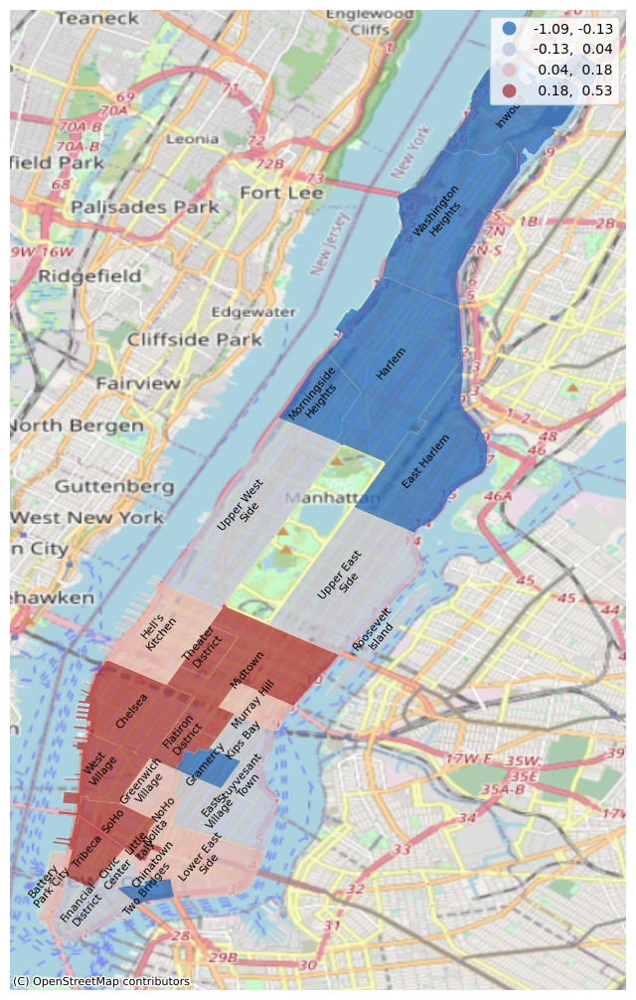

In [18]:
# Generate map showing average residuals for each neighbourhood

# Producing a map of the average residual by neighborhood
import requests
import geopandas as gpd
from shapely.geometry import shape
import textwrap

# Reading in the NYC Neighborhoods shapefile from data file
import os

nyc_n = gpd.read_file(os.path.join(path,"NYC Neighborhoods/NYC_Neighborhoods.geojson"), driver='GeoJSON')

# Merging
nyc_n_r = nyc_n.merge(mean, left_on='neighborhood', right_on="neighbourhood_cleansed")

f, ax = plt.subplots(1, figsize=(8, 15))
   
# Plot choropleth of local statistics
nyc_n_r.plot(
    column='neighborhood_residual', 
    cmap='vlag', 
    scheme='quantiles',
    k=4, 
    edgecolor='white', 
    linewidth=0.1, 
    alpha=0.75,
    legend=True,
    ax=ax
)

# Add basemap
contextily.add_basemap(
    ax,
    crs=nyc_n.crs,
    #source=contextily.providers.Stamen.Watercolor,
    source=contextily.providers.OpenStreetMap.Mapnik
)

for idx, row in nyc_n_r.iterrows():
    txt=row['neighborhood']
    n_txt = '\n'.join(textwrap.wrap(txt, width=11, replace_whitespace=True))
    #print(n_txt)                  
    plt.annotate(text=n_txt, xy=tuple([row.geometry.centroid.x, row.geometry.centroid.y]),
                 horizontalalignment='center',fontsize=8, rotation=50, wrap=True)

    
# Remove axis
ax.set_axis_off()

# Display
plt.show()
#f.savefig(r"G:\My Drive\Geospatial Data Science with Python\Neighborhood Residuals.png")

_Interpretation:_ Residuals in one neighbourhood tend to be similar to that of proximate neighbourhoods.
Grouping could represent _geographic creep_ in residuals from one neighbourhood to another. Our model does not yet have ability to pick up this geographic signal.

#### Using spatial lags to check for geographic structure

* create __knn-based spatial weights matrix__ to look at residuals of 5 nearest AirBnBs
* construct __spatial lag__
* check for __spatial autocorrelation__: compare spatial lag to the model residual for each observation

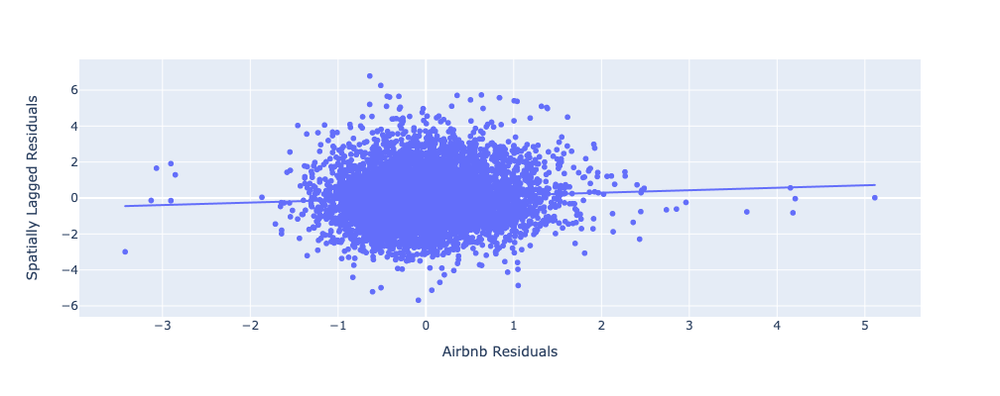

In [19]:
# Bringing in the geometry attribute (needed for knn)
residuals_neighborhood = residuals_neighborhood.merge(listings_manhattan[['id','geometry']], how='left',on='id')

# Building the spatial weights matrix
knn = weights.KNN.from_dataframe(residuals_neighborhood, k=5)

# Constructing the spatial lag of residuals for 5 nearest neighbours
lag_residual = weights.spatial_lag.lag_spatial(knn, ols_m.u)

# Plotting the results
fig = px.scatter(x=ols_m.u.flatten(), y=lag_residual.flatten(), trendline="ols",
                width=1000, height=400)

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()


_Interpretation:_ There is positive spatial autocorrelation.

# 3. Spatial Regression Model: OLS Regression Analysis w/ Spatial Atributes

* feature engineering
* building space into model via spatial fixed effects

## 3.1 Spatial Feature Engineering

* Distance to major attractions
* Distance bands (count within radius)

In [20]:
# Reading in data on popular NYC Attractions
nyc_attr = pd.read_csv('../Data/NYC_Attractions/NYC Attractions.csv')

# Convert PDF to GPDF
nyc_attr_gpdf =  gpd.GeoDataFrame(
    nyc_attr,
    geometry=gpd.points_from_xy(nyc_attr['Longitude'],
                                   nyc_attr['Latitude'],
                                   crs="EPSG:4326")
)

# Calculate the distance to each attraction per airbnb
attractions = nyc_attr_gpdf.Attraction.unique()

# Converting to a projected coordinate system
nyc_attr_gpdf_p = nyc_attr_gpdf.to_crs('EPSG:2263')
listings_manhattan_p = listings_manhattan.to_crs('EPSG:2263')

# Applying a lambda function that calls geopandas distance function to calcuate the distance between each airbnb and each attraction
distances = listings_manhattan_p.geometry.apply(lambda g: nyc_attr_gpdf_p.distance(g))

# Renaming the columns based on the attraction for which the distance is calculated
distances.columns = attractions

# Convert from 'US survey foot' to miles
distances = distances.apply(lambda x: x/5280, axis=1)

# Check to see which locations are less than 1 to 6 miles
distances_1mi = distances.apply(lambda x: x <=1, axis=1).sum(axis=1)
distances_2mi = distances.apply(lambda x: x <=2, axis=1).sum(axis=1)
distances_3mi = distances.apply(lambda x: x <=3, axis=1).sum(axis=1)
distances_4mi = distances.apply(lambda x: x <=4, axis=1).sum(axis=1)
distances_5mi = distances.apply(lambda x: x <=5, axis=1).sum(axis=1)
distances_6mi = distances.apply(lambda x: x <=6, axis=1).sum(axis=1)

# Creating a dataframe combining all the distance bands
distance_df = pd.concat([distances_1mi,distances_2mi,distances_3mi,distances_4mi,distances_5mi,distances_6mi], axis=1)
distance_df.columns = ['Attr_1mi','Attr_2mi','Attr_3mi','Attr_4mi','Attr_5mi','Attr_6mi']

# Joining back to the listings geopandas df
listings_manhattan = listings_manhattan.merge(distances, left_index=True, right_index=True)
listings_manhattan = listings_manhattan.merge(distance_df, left_index=True, right_index=True)

listings_manhattan.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,Chrysler Building,Times Square,MoMa,Charging Bull,Attr_1mi,Attr_2mi,Attr_3mi,Attr_4mi,Attr_5mi,Attr_6mi
1,3533741,https://www.airbnb.com/rooms/3533741,20231001204715,2023-10-02,previous scrape,Rental unit in New York · 1 bedroom · 1 bed · ...,Come stay in the heart of historic Hells Kitch...,NaN,https://a0.muscache.com/pictures/45157664/862a...,17791294,...,1.334732,0.749111,0.715865,4.645164,4,7,7,7,8,8
5,53903662,https://www.airbnb.com/rooms/53903662,20231001204715,2023-10-02,city scrape,Condo in New York · ★4.43 · 1 bedroom · 1 bed ...,"This room is in a full floor, 4 bedroom apartm...",The East Village is located in Downtown Manhat...,https://a0.muscache.com/pictures/61ebc358-7be7...,74338125,...,1.848879,2.192072,2.474155,2.059076,0,2,7,8,9,9
6,53722728,https://www.airbnb.com/rooms/53722728,20231001204715,2023-10-02,city scrape,Condo in New York · ★4.29 · 1 bedroom · 1 bed ...,"This room is in a full floor, 4 bedroom apartm...",The East Village is located in Downtown Manhat...,https://a0.muscache.com/pictures/6633c373-1642...,74338125,...,1.747519,2.065304,2.359816,2.117501,0,2,7,7,9,9
8,3539618,https://www.airbnb.com/rooms/3539618,20231001204715,2023-10-02,previous scrape,Rental unit in New York · ★4.67 · Studio · 1 b...,This is a large alcove studio in a new buildin...,NaN,https://a0.muscache.com/pictures/44646761/af5f...,506909,...,0.985925,1.420784,1.635385,2.890117,2,5,7,8,9,9
10,675959117355164668,https://www.airbnb.com/rooms/675959117355164668,20231001204715,2023-10-02,city scrape,Rental unit in New York · 1 bedroom · 1 bed · ...,Enjoy convenience in this centrally-located He...,Convenient and filled with food options and co...,https://a0.muscache.com/pictures/d969a120-e590...,1863597,...,1.121421,0.514538,0.556138,4.429091,4,7,7,7,8,8


## 3.2 Modeling with Proximity Features

In [21]:
# Geographic Features
g_vars = ['Central Park', 'Central Park Zoo', 'Empire State Building', 'Statue of Liberty', 
          'Rockeffeller Center', 'Chrysler Building', 'Times Square', 'MoMa', 'Charging Bull']

# Bring the geographic features into our subset
#listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id', 'Central Park', 'Central Park Zoo', 'Empire State Building', 'Statue of Liberty', 
#          'Rockeffeller Center', 'Chrysler Building', 'Times Square', 'MoMa', 'Charging Bull']], how='left',on='id')
listings_manhattan_subset = listings_manhattan_subset.merge(listings_manhattan[['id'] + g_vars], how='left',on='id')

# Adding geographic features to model variables used previously
g_m_vars = m_vars + g_vars

#REMOVEING SHARED ROOMS, AS THEY ARE PERFECTLY CORRELATED WITH PRIVATE ROOM AND THIS CAUSES PROBLEMS LATER
#g_m_vars.remove('rt_shared_room')

listings_manhattan_subset.head()

,id,room_type,accommodates,bedrooms,beds,review_scores_rating,price,rt_entire_home_apartment,rt_private_room,rt_shared_room,...,neighbourhood_cleansed,Central Park,Central Park Zoo,Empire State Building,Statue of Liberty,Rockeffeller Center,Chrysler Building,Times Square,MoMa,Charging Bull
0,21748242,Entire home/apt,2,1.0,1.0,0.00,150.0,1,0,0,...,Nolita,4.577922,3.395763,1.886882,3.400847,2.678770,2.302138,2.528714,2.873516,1.525310
1,895502673828974285,Entire home/apt,4,1.0,2.0,5.00,160.0,1,0,0,...,Upper West Side,0.853367,0.678342,1.927494,6.895244,1.186155,1.686756,1.278347,1.002925,5.246109
2,9731739,Entire home/apt,5,2.0,3.0,4.48,184.0,1,0,0,...,Hell's Kitchen,1.677526,0.843999,1.201598,6.066589,0.676492,1.166360,0.546644,0.607182,4.438578
3,33396290,Entire home/apt,12,2.0,6.0,4.45,628.0,1,0,0,...,Washington Heights,3.610011,4.797373,6.301621,11.302717,5.508193,5.922952,5.681583,5.313307,9.656289
4,30417665,Entire home/apt,4,1.0,3.0,4.28,329.0,1,0,0,...,Washington Heights,3.696443,4.885345,6.388253,11.384495,5.595367,6.011611,5.766939,5.400441,9.741761


In [22]:
## perform regression with original and new (geographic) features

ols_m_g = spreg.OLS(
    listings_manhattan_subset[["log_price"]].values,
    listings_manhattan_subset[g_m_vars].values,
    name_y = 'log_price',
    name_x = g_m_vars
)

print(ols_m_g.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:        6690
Mean dependent var  :      5.4212                Number of Variables   :          16
S.D. dependent var  :      0.6844                Degrees of Freedom    :        6674
R-squared           :      0.3746
Adjusted R-squared  :      0.3731
Sum squared residual:     1959.57                F-statistic           :    266.4520
Sigma-square        :       0.294                Prob(F-statistic)     :           0
S.E. of regression  :       0.542                Log likelihood        :   -5385.402
Sigma-square ML     :       0.293                Akaike info criterion :   10802.805
S.E of regression ML:      0.5412                Schwarz criterion     :   10911.739

------------------------------------------------------------

In [23]:
## model performance
model_diagnostics = pd.DataFrame(
    [[ols_m.r2, ols_m.ar2], [ols_m_g.r2, ols_m_g.ar2]],
    index=["OLS", "OLS with spatial features"],
    columns=["R2", "Adj. R2"],
)

model_diagnostics

,R2,Adj. R2
OLS,0.246666,0.245989
OLS with spatial features,0.374554,0.373148


#### Did includsion of geographic features improve spatial autocorrelation issues?

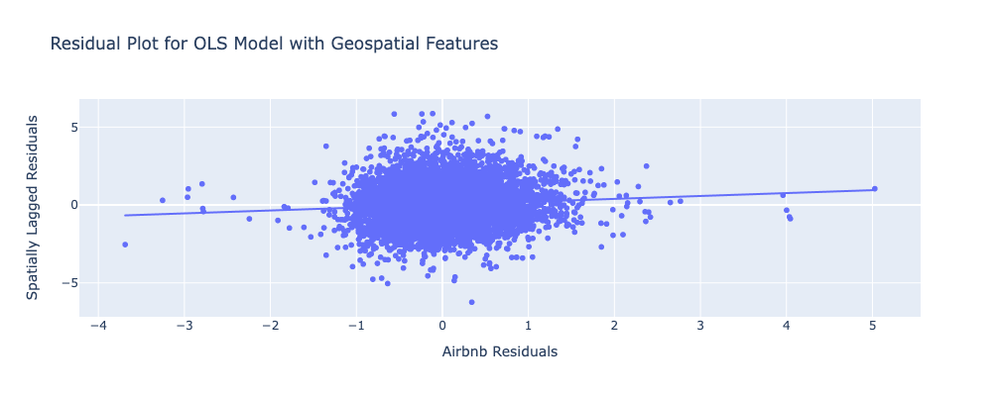

In [24]:
# Constructing the spatial lag
lag_residual_2 = weights.spatial_lag.lag_spatial(knn, ols_m_g.u)

# Plotting the results
fig = px.scatter(x=ols_m_g.u.flatten(), y=lag_residual_2.flatten(), trendline="ols",
                width=1000, height=400, title="Residual Plot for OLS Model with Geospatial Features")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()

_Interpretation:_ There is still spatial structure.

Can we address those by including spatial fixed effects?

## 3.3 Spatial Fixed Effects Model

* spatial nonstationarity: variation across space between the outcome variables and the explanatory variables
* one way to account for spatial nonstationarity is by adding spatial fixed effects to model
* fixed effect: effect that is held constant within some cross-section of the data while other model parameters are allowed to vary
* _OLS_Regimes_ function from _spreg_
* use __neighbourhood__ as fixed effect

In [25]:
# spatial fixed effect model implementation
sfe_m = spreg.OLS_Regimes(
    #The dependent variable (Y) - Log Price (log_price)
    listings_manhattan_subset[["log_price"]].values,
    
    # The independent variables (Xs)
    listings_manhattan_subset[g_m_vars].values,
    
    # Variable which specifies which neighborhood each airbnb falls within
    listings_manhattan_subset["neighbourhood_cleansed"].tolist(),
    
    # Vary constant by each cross-section/group
    constant_regi="many",
    
    # Here we tell the model that the variables are kept constant by group
    cols2regi=[False] * len(g_m_vars),
    
    # Here we tell the model to estimate a single sigma coefficient
    regime_err_sep=False,
    
    # Dependent variable name
    name_y="log_price",
    
    # Independent variables names
    name_x=g_m_vars,
)
# printing the model summary
print(sfe_m.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES - REGIMES
---------------------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:        6690
Mean dependent var  :      5.4212                Number of Variables   :          47
S.D. dependent var  :      0.6844                Degrees of Freedom    :        6643
R-squared           :      0.3895
Adjusted R-squared  :      0.3853
Sum squared residual:     1912.59                F-statistic           :     92.1541
Sigma-square        :       0.288                Prob(F-statistic)     :           0
S.E. of regression  :       0.537                Log likelihood        :   -5304.236
Sigma-square ML     :       0.286                Akaike info criterion :   10702.472
S.E of regression ML:      0.5347                Schwarz criterion     :   11022.465

----------------------------------------

In [26]:
## model performance
model_diagnostics = pd.DataFrame(
    [[ols_m.r2, ols_m.ar2], [ols_m_g.r2, ols_m_g.ar2], [sfe_m.r2, sfe_m.ar2]],
    index=["OLS Model", "OLS Model with spatial features", "Spatial Fixed Effects Model"],
    columns=["R2", "Adj. R2"],
)

model_diagnostics

,R2,Adj. R2
OLS Model,0.246666,0.245989
OLS Model with spatial features,0.374554,0.373148
Spatial Fixed Effects Model,0.389547,0.385320


In [27]:
## Chow Test 
# tells us whether the inclusion of fixed groups or regimes is statistically significant
# first value: Chow value
# second value: p-value

sfe_m.chow.joint

(163.16377697447052, 7.020191827297806e-20)

_Interpretation:_ there is a statistically significant effect of neighbourhood

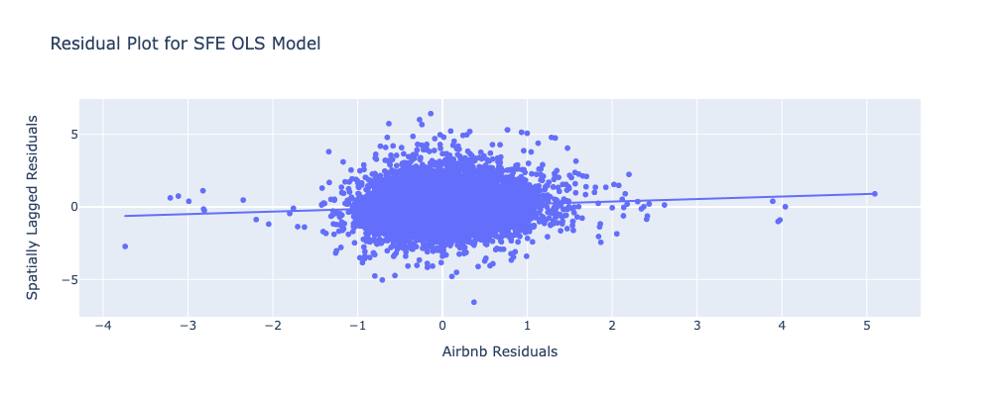

In [28]:
## Examine spatial autocorrelation again

# Constructing the spatial lag
lag_residual_3 = weights.spatial_lag.lag_spatial(knn, sfe_m.u)

# Plotting the results
fig = px.scatter(x=sfe_m.u.flatten(), y=lag_residual_3.flatten(), trendline="ols",
                width=1000, height=400, title="Residual Plot for SFE OLS Model")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="Spatially Lagged Residuals"
)

fig.show()

_Interpretation:_ Although there is a significant effect of neighbourhood, there is only a minor effect in accounting for the spatial structure in the data

## 4.0 Geographically Weighted Regression

GWR helps address spatial nonstationarity further by fitting local regression models for each independent, explanatory, variable.

__Background:__
* OLS-based models fit a set of global estimates
* GWR examine the way in which the relationship between each predictor variable varies across space with respect to the dependent variable
    * iteratively fit a localized regression within a search window or neighbourhood around each observation
    * regression point: observation for whcih the regression is being fit
    * fitting regression within these local neighbourhoods is performed be using either a
        * fixed kernel: uses an identical search area across all regression points
        * adaptive kernel: search area can vary across space 
    * search area is based on __bandwidth__ parameter, which represents upward bound,after which the weight assigned to the observation points to zero
        * larger bandwidth: more observations will be included in the local regression model
    * GWR models assume that the scale of the neighbourhood is identical for each of the independent variables
        * optimal bandwidth determined by the algorithm will be the same for all independent variables

In [29]:
# import GWR packages
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW # for selecting bandwidth

Here, I had to experiment with the explanatory variables to get the bandwidth selector to run property. Specifically, I had to remove binary variables and highly correlated variables.

Test - does the code run with the following explanatory variables
5: y
6: y
10: y
all (13): n
12: n
11: y
there seems to be something wrong with 12 (MoMa)
remove MoMa: n
Result: use g_m_vars_gwr[:11] (the others are likely too closely correlated r>0.99)

In [30]:
## remove binary variables from model (cannot seem to handle it)
g_m_vars_gwr = [x for x in g_m_vars if x not in ['rt_entire_home_apartment','rt_private_room']]
g_m_vars_gwr

# From here, I still had to remove the last two features (MoMa and Charging Bull), as they were highly correlated with some other features

['accommodates',
 'bedrooms',
 'beds',
 'review_scores_rating',
 'Central Park',
 'Central Park Zoo',
 'Empire State Building',
 'Statue of Liberty',
 'Rockeffeller Center',
 'Chrysler Building',
 'Times Square',
 'MoMa',
 'Charging Bull']

In [31]:
# add geometry to listings_subset
listings_manhattan_subset2 = listings_manhattan_subset.merge(listings_manhattan[['id', 'geometry']], on='id', how='left').reset_index(drop=True)

# Setting the explanatory variables
#exp_vars = listings_manhattan[['accommodates', 'bedrooms','beds','review_scores_rating']].values
exp_vars = listings_manhattan_subset2[g_m_vars_gwr[:11]].values

# Setting the dependent variable: log_price
y = (listings_manhattan_subset2['log_price'].values).reshape((-1,1))

# Defining the coordinates of the observations
#coords = list(zip(listings_manhattan_subset2.geometry.x,listings_manhattan_subset2.geometry.y))
# Defining the coordinates of the observations
coords = list(zip(listings_manhattan_subset2['geometry'].apply(lambda geom: geom.x),
                  listings_manhattan_subset2['geometry'].apply(lambda geom: geom.y)))

In [32]:
# Find the optimal bandwidth for the explanatory variables
gwr_selector = Sel_BW(coords, y, exp_vars, spherical=True)
gwr_bw = gwr_selector.search(bw_min=50)

# Displaying the optimal bandwidth
gwr_bw

181.0

In [33]:
# Fit the GWR model to your data
gwr_results = GWR(coords, y, exp_vars, gwr_bw).fit()

# Print the results of the GWR model
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                6690
Number of covariates:                                                    12

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           2034.962
Log-likelihood:                                                   -5511.691
AIC:                                                              11047.383
AICc:                                                             11049.437
BIC:                                                             -56787.327
R2:                                                                   0.350
Adj. R2:                                                              0.349

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [34]:
## model performance
model_diagnostics = pd.DataFrame(
    [[ols_m.r2, ols_m.ar2], [ols_m_g.r2, ols_m_g.ar2], [sfe_m.r2, sfe_m.ar2], [gwr_results.R2, gwr_results.adj_R2]],
    index=["OLS Model", "OLS Model with spatial features", "Spatial Fixed Effects Model", "Geographically Weighted (GWR)"],
    columns=["R2", "Adj. R2"],
)

model_diagnostics

,R2,Adj. R2
OLS Model,0.246666,0.245989
OLS Model with spatial features,0.374554,0.373148
Spatial Fixed Effects Model,0.389547,0.385320
Geographically Weighted (GWR),0.559427,0.507461


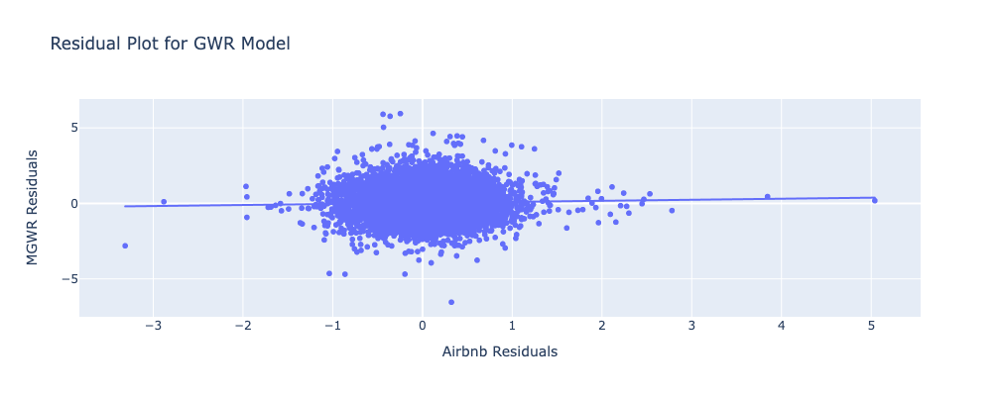

In [35]:
## Look at spatial autocorrelation (residuals)

residuals = gwr_results.resid_response

# Constructing the spatial lag
lag_residual_4 = weights.spatial_lag.lag_spatial(knn, residuals)

# Plotting the results
fig = px.scatter(x=residuals.flatten(), y=lag_residual_4.flatten(), trendline="ols",
                width=1000, height=400, title="Residual Plot for GWR Model")

# Updating the x and y axis labels
fig.update_layout(
    xaxis_title="Airbnb Residuals", yaxis_title="MGWR Residuals"
)

fig.show()

## 4.1 Multi-scale Geographically Weighted Regression

* relaxes assumption that the neighbouring scale for each explanatory variable is identical
* allows the scale of the analysis to vary for each of the explanatory variables
* an optimal bandwidth parameter is selected for each of the independent variables
* great for working with large datasets where patterns between the independent and dependent variables vary across space and scale
* high computational complexity and drastically increased runtime

In [36]:
from mgwr.gwr import MGWR

In [37]:
g_m_vars_gwr

['accommodates',
 'bedrooms',
 'beds',
 'review_scores_rating',
 'Central Park',
 'Central Park Zoo',
 'Empire State Building',
 'Statue of Liberty',
 'Rockeffeller Center',
 'Chrysler Building',
 'Times Square',
 'MoMa',
 'Charging Bull']

In [38]:
# because this takes forever when we have all variables (estimateing ~100 hours), I'm only using the first 4
exp_vars = listings_manhattan_subset2[g_m_vars_gwr[:4]].values

In [39]:
# Standardizing
exp_vars = (exp_vars - exp_vars.mean(axis=0)) / exp_vars.std(axis=0)
y = (y - y.mean(axis=0)) / y.std(axis=0)

In [47]:
# Select bandwidths
# set multi=True to allow for different bandwidths for explanatory variables

import time
st = time.time() # get the start time

selector = Sel_BW(coords, y, exp_vars, multi=True, spherical=True)
selector.search(multi_bw_min=[50])

et = time.time() # get the end time
elapsed_time = et - st

In [45]:
print('Execution time:', elapsed_time, 'seconds')

elapsed_time_min = elapsed_time/60
print('Execution time:', elapsed_time_min, 'minutes')

elapsed_time_hours = elapsed_time_min/60
print('Execution time:', elapsed_time_hours, 'hours')

Execution time: 3781.636654138565 seconds
Execution time: 63.02727756897608 minutes
Execution time: 1.0504546261496013 hours


When including all 11 features,this ran for >30 hours, then I stopped it.

In [41]:
# Fit the GWR model to your data
mgwr_results = MGWR(coords, y, exp_vars, selector, sigma2_v1=True).fit()

# Print the results of the GWR model
print(mgwr_results)

mgwr_results.summary()

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Model type                                                         Gaussian
Number of observations:                                                6690
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           5212.876
Log-likelihood:                                                   -8658.181
AIC:                                                              17326.363
AICc:                                                             17328.375
BIC:                                                             -53671.071
R2:                                                                   0.221
Adj. R2:                                                              0.220

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [42]:
mgwr_results.R2, mgwr_results.adj_R2

(0.5581882489801898, 0.5096957819389629)

In [43]:
## model performance
model_diagnostics = pd.DataFrame(
    [[ols_m.r2, ols_m.ar2], [ols_m_g.r2, ols_m_g.ar2], [sfe_m.r2, sfe_m.ar2], 
     [gwr_results.R2, gwr_results.adj_R2], [mgwr_results.R2, mgwr_results.adj_R2]],
    index=["OLS Model", "OLS Model with spatial features", "Spatial Fixed Effects Model", 
           "Geographically Weighted (GWR)", "Multiscale Geographically Weighted (MGWR)"],
    columns=["R2", "Adj. R2"],
)

model_diagnostics

,R2,Adj. R2
OLS Model,0.246666,0.245989
OLS Model with spatial features,0.374554,0.373148
Spatial Fixed Effects Model,0.389547,0.385320
Geographically Weighted (GWR),0.559427,0.507461
Multiscale Geographically Weighted (MGWR),0.558188,0.509696


Note that the MGWR only has 4 features, compared to 11 features for the other models to make runtime more reasonable.